# Install detectron2

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 7.0 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15800, done.
remote: Counting objects: 100% (57/57), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 15800 (delta 20), reused 33 (delta 13), pack-reused 15743 (from 1)
Receiving objects: 100% (15800/15800), 6.38 MiB | 11.68 MiB/s, done.
Resolving deltas: 100% (11512/11512), done.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your e

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.5 ; cuda:  cu121
detectron2: 0.6


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [4]:
!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar
!tar -xvf VOCtrainval_11-May-2012.tar

Streaming output truncated to the last 5000 lines.
VOCdevkit/VOC2012/SegmentationClass/2008_001874.png
VOCdevkit/VOC2012/SegmentationClass/2008_001876.png
VOCdevkit/VOC2012/SegmentationClass/2008_001882.png
VOCdevkit/VOC2012/SegmentationClass/2008_001885.png
VOCdevkit/VOC2012/SegmentationClass/2008_001895.png
VOCdevkit/VOC2012/SegmentationClass/2008_001896.png
VOCdevkit/VOC2012/SegmentationClass/2008_001926.png
VOCdevkit/VOC2012/SegmentationClass/2008_001966.png
VOCdevkit/VOC2012/SegmentationClass/2008_001971.png
VOCdevkit/VOC2012/SegmentationClass/2008_001992.png
VOCdevkit/VOC2012/SegmentationClass/2008_001997.png
VOCdevkit/VOC2012/SegmentationClass/2008_002032.png
VOCdevkit/VOC2012/SegmentationClass/2008_002043.png
VOCdevkit/VOC2012/SegmentationClass/2008_002064.png
VOCdevkit/VOC2012/SegmentationClass/2008_002066.png
VOCdevkit/VOC2012/SegmentationClass/2008_002067.png
VOCdevkit/VOC2012/SegmentationClass/2008_002073.png
VOCdevkit/VOC2012/SegmentationClass/2008_002079.png
VOCdevkit/VOC

In [5]:
!mkdir -p datasets/
!mv VOCdevkit/* datasets/
!rmdir VOCdevkit

# Object Recognition on pretrained model

[11/15 00:17:30 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...


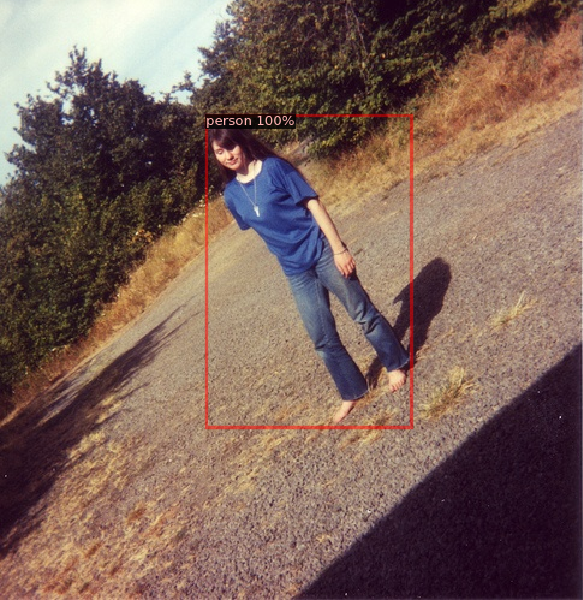

In [8]:
im = cv2.imread("/content/datasets/VOC2012/JPEGImages/2007_000027.jpg")
cfg0 = get_cfg()
cfg0.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg0.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg0.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg0)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg0.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

[11/15 00:18:11 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...


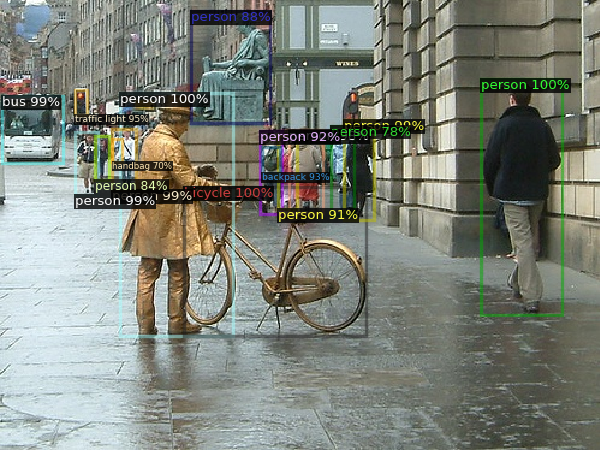

In [9]:
im = cv2.imread("/content/datasets/VOC2012/JPEGImages/2007_000793.jpg")
cfg0 = get_cfg()
cfg0.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg0.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg0.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg0)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg0.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

[11/15 00:18:42 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...


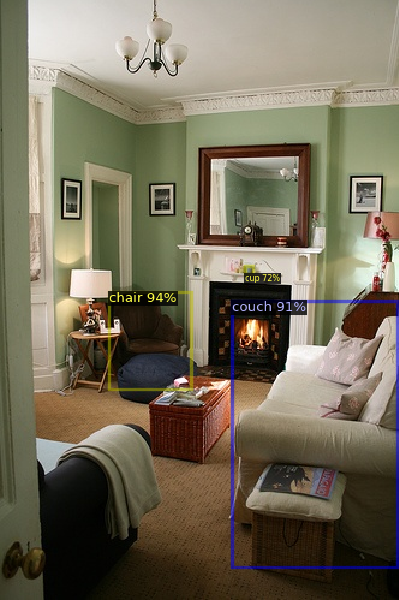

In [10]:
im = cv2.imread("/content/datasets/VOC2012/JPEGImages/2007_000804.jpg")
cfg0 = get_cfg()
cfg0.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg0.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg0.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg0)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg0.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

[11/15 00:19:22 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...


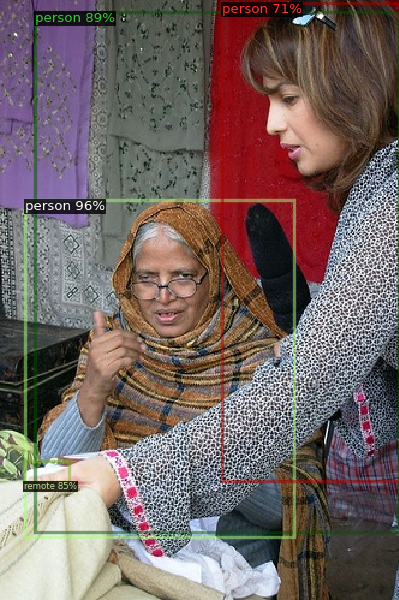

In [11]:
im = cv2.imread("/content/datasets/VOC2012/JPEGImages/2007_003091.jpg")
cfg0 = get_cfg()
cfg0.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg0.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg0.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg0)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg0.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

[11/15 00:19:57 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...


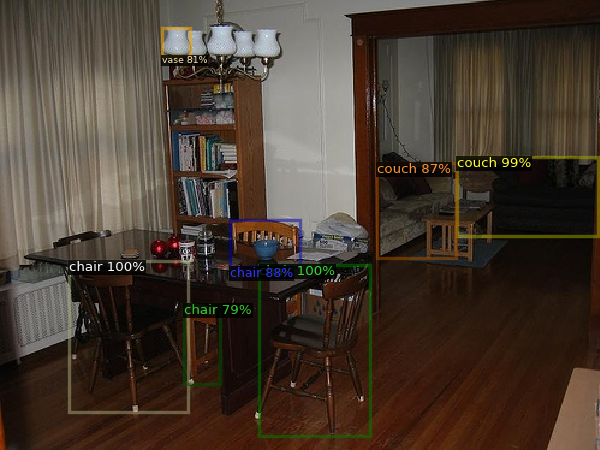

In [12]:
im = cv2.imread("/content/datasets/VOC2012/JPEGImages/2007_005647.jpg")
cfg0 = get_cfg()
cfg0.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg0.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg0.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg0)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg0.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

[11/15 00:21:12 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...


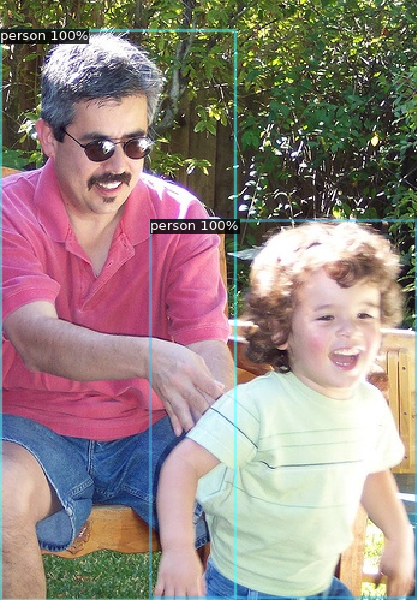

In [13]:
im = cv2.imread("/content/datasets/VOC2012/JPEGImages/2007_006442.jpg")
cfg0 = get_cfg()

cfg0.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg0.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg0.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg0)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg0.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

[11/15 00:21:48 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...


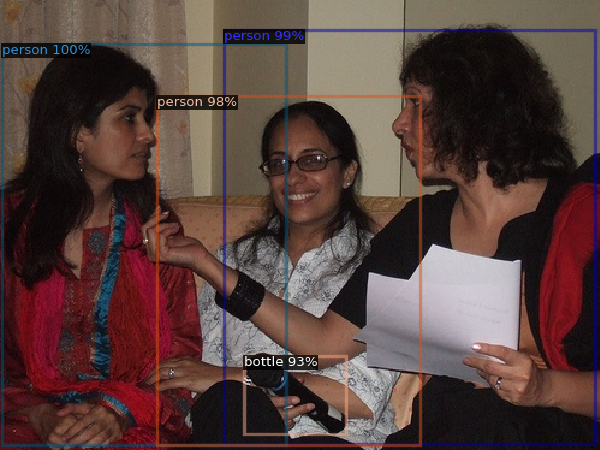

In [14]:
im = cv2.imread("/content/datasets/VOC2012/JPEGImages/2007_009653.jpg")
cfg0 = get_cfg()

cfg0.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg0.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg0.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg0)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg0.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

# Train on a custom dataset

In [15]:
#@title Register dataset

from detectron2.data.datasets import register_pascal_voc
from detectron2.data import MetadataCatalog


for dataset_name in ["voc_2012_train", "voc_2012_val"]:
    if dataset_name in DatasetCatalog:
        DatasetCatalog.remove(dataset_name)
    if dataset_name in MetadataCatalog:
        MetadataCatalog.pop(dataset_name, None)


register_pascal_voc("voc_2012_train", "datasets/VOC2012", "train", 2012)
register_pascal_voc("voc_2012_val", "datasets/VOC2012", "val", 2012)

In [16]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.OUTPUT_DIR = 'MyVOCTraining'
cfg.DATASETS.TRAIN = ("voc_2012_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 1
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 3000
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 20

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[11/15 00:22:19 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[11/15 00:22:20 d2.engine.train_loop]: Starting training from iteration 0
[11/15 00:22:30 d2.utils.events]:  eta: 0:19:25  iter: 19  total_loss: 3.99  loss_cls: 3.125  loss_box_reg: 0.8509  loss_rpn_cls: 0.01257  loss_rpn_loc: 0.01228    time: 0.3953  last_time: 0.4470  data_time: 0.0186  last_data_time: 0.0060   lr: 4.9953e-06  max_mem: 2801M
[11/15 00:22:43 d2.utils.events]:  eta: 0:20:09  iter: 39  total_loss: 3.72  loss_cls: 3.04  loss_box_reg: 0.7025  loss_rpn_cls: 0.0089  loss_rpn_loc: 0.01411    time: 0.4081  last_time: 0.4169  data_time: 0.0112  last_data_time: 0.0055   lr: 9.9902e-06  max_mem: 2801M
[11/15 00:22:50 d2.utils.events]:  eta: 0:19:47  iter: 59  total_loss: 3.633  loss_cls: 2.804  loss_box_reg: 0.7288  loss_rpn_cls: 0.01018  loss_rpn_loc: 0.01994    time: 0.4005  last_time: 0.4509  data_time: 0.0117  last_data_time: 0.0317   lr: 1.4985e-05  max_mem: 2801M
[11/15 00:22:58 d2.utils.events]:  eta: 0:19:22  iter: 79  total_loss: 3.279  loss_cls: 2.482  loss_box_reg: 0.

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir MyVOCTraining

Reusing TensorBoard on port 6007 (pid 15010), started 0:00:20 ago. (Use '!kill 15010' to kill it.)

<IPython.core.display.Javascript object>

# Inference & evaluation using the trained model




In [17]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

[11/15 00:46:31 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from MyVOCTraining/model_final.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

Then, we randomly select several samples to visualize the prediction results.

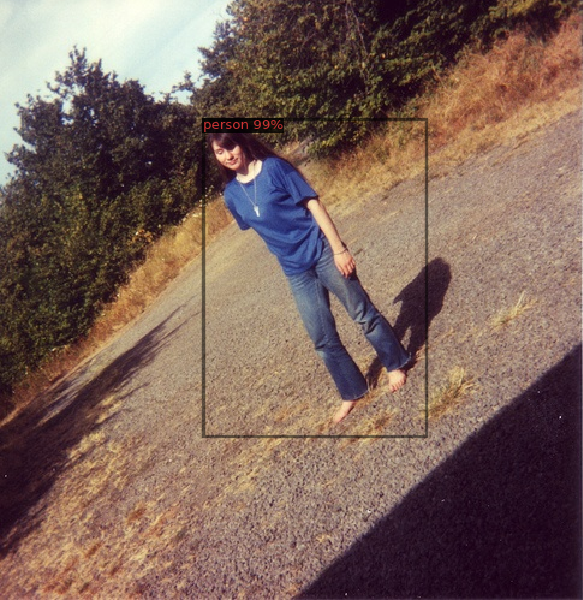

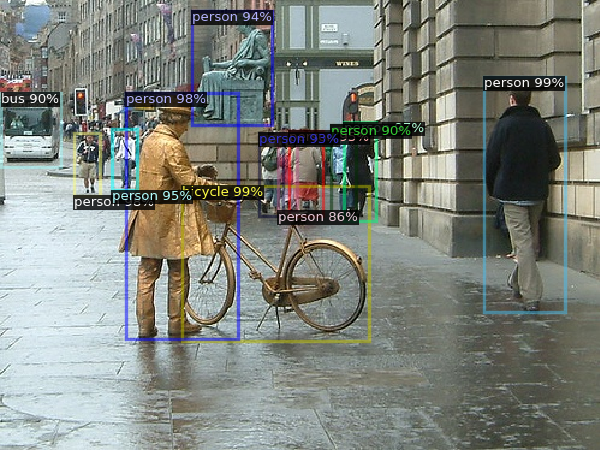

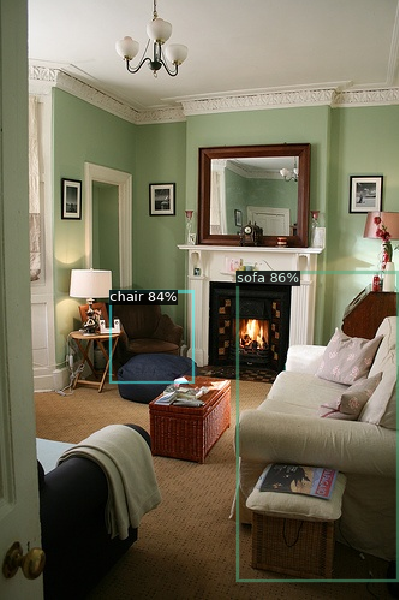

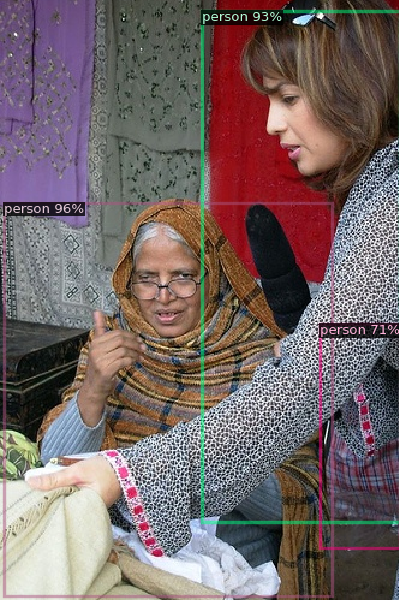

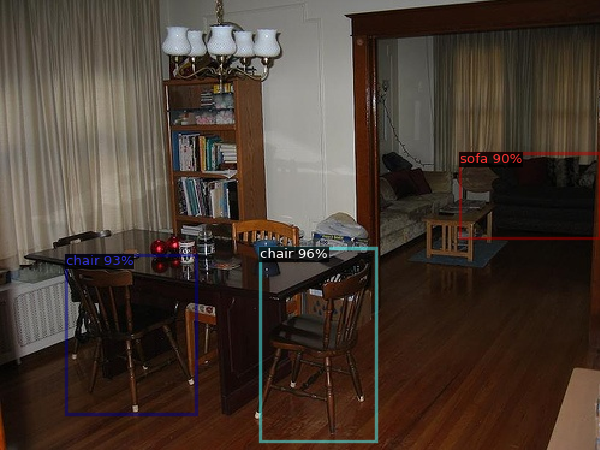

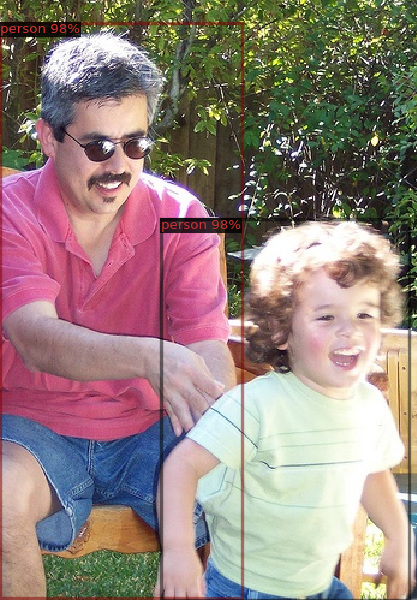

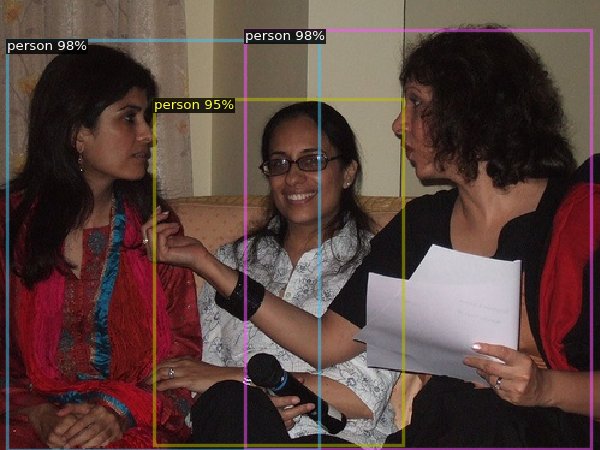

In [18]:
from detectron2.utils.visualizer import ColorMode
import cv2
from detectron2.utils.visualizer import Visualizer

file_paths = [
    '/content/datasets/VOC2012/JPEGImages/2007_000027.jpg',
    '/content/datasets/VOC2012/JPEGImages/2007_000793.jpg',
    '/content/datasets/VOC2012/JPEGImages/2007_000804.jpg',
    '/content/datasets/VOC2012/JPEGImages/2007_003091.jpg',
    '/content/datasets/VOC2012/JPEGImages/2007_005647.jpg',
    '/content/datasets/VOC2012/JPEGImages/2007_006442.jpg',
    '/content/datasets/VOC2012/JPEGImages/2007_009653.jpg'
]

# Get metadata for the VOC dataset
voc_metadata = MetadataCatalog.get("voc_2012_train")

for file_path in file_paths:

    im = cv2.imread(file_path)
    outputs = predictor(im)

    # Create the Visualizer to visualize segmentation or bounding box predictions
    v = Visualizer(
        im[:, :, ::-1],
        metadata=voc_metadata,
        scale=1.2
    )

    # Draw instance predictions (bounding boxes or segmentation masks)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])


In [ ]:
#@title Calculating evaluation metrics
from detectron2.evaluation import PascalVOCDetectionEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = PascalVOCDetectionEvaluator("voc_2012_val")
val_loader = build_detection_test_loader(cfg, "voc_2012_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[11/09 05:25:12 d2.data.build]: Distribution of instances among all 20 categories:
|  category   | #instances   |  category   | #instances   |  category  | #instances   |
|:-----------:|:-------------|:-----------:|:-------------|:----------:|:-------------|
|  aeroplane  | 484          |   bicycle   | 380          |    bird    | 629          |
|    boat     | 491          |   bottle    | 733          |    bus     | 320          |
|     car     | 1173         |     cat     | 618          |   chair    | 1449         |
|     cow     | 347          | diningtable | 374          |    dog     | 773          |
|    horse    | 373          |  motorbike  | 376          |   person   | 5110         |
| pottedplant | 542          |    sheep    | 485          |    sofa    | 387          |
|    train    | 329          |  tvmonitor  | 414          |            |              |
|    total    | 15787        |             |              |            |              |
[11/09 05:25:12 d2.data.dataset_mappe